In [1]:
import torch
import numpy as np
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from scipy.ndimage import zoom
from tqdm.notebook import tqdm
from Vit_RGTS.vit_rgts.main import VitRGTS
import torch.nn.functional as F
import matplotlib.pyplot as plt

import torch.nn as nn
from torch.optim import Adam

# 모델 파라미터 및 데이터 랜덤성 방지
seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

## 데이터 불러오기


In [2]:
# 1. Setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# 2. Data Preparation
# 사용자 정의 변환: PIL 이미지를 RGB로 변환
def convert_to_rgb(image):
    if image.mode != "RGB":
        image = image.convert("RGB")  # RGBA 또는 P 모드 이미지도 RGB로 변환
    return image

# 변환 구성
transform = transforms.Compose([
    transforms.Lambda(convert_to_rgb),  # RGB로 변환
    transforms.Resize((224, 224)),      # 크기 조정
    transforms.ToTensor(),              # 텐서로 변환
])

# Training data
train_dataset_path = "food_classification/train"
train_dataset = datasets.ImageFolder(root=train_dataset_path, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)

# Validation data
val_dataset_path = "food_classification/validation"
val_dataset = datasets.ImageFolder(root=val_dataset_path, transform=transform)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

# Test data
test_dataset_path = "food_classification/test"
test_dataset = datasets.ImageFolder(root=test_dataset_path, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

## 모델 초기화

In [3]:
num_register_tokens = 8
num_epochs = 5

# 3. Model Initialization
model_with_register = VitRGTS(
    image_size=224,
    patch_size=16,
    num_classes=5,
    dim=256,
    depth=12,
    heads=4,
    mlp_dim=512,
    dropout=0.1,
    num_register_tokens=num_register_tokens,
    use_register_tokens=True
).to(device)

model_without_register = VitRGTS(
    image_size=224,
    patch_size=16,
    num_classes=5,
    dim=256,
    depth=12,
    heads=4,
    mlp_dim=512,
    dropout=0.1,
    use_register_tokens=False
).to(device)

## 모델 학습 및 예측

In [4]:
# 4. Loss Function and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer_with_register = Adam(model_with_register.parameters(), lr=0.0002, weight_decay=1e-4)
optimizer_without_register = Adam(model_without_register.parameters(), lr=0.0002, weight_decay=1e-4)

def diversity_loss(attn_map, num_register_tokens):
    """
    레지스터 토큰 간의 코사인 유사도를 최소화하는 손실 함수
    Args:
        attn_map: 어텐션 맵 (batch, heads, tokens, tokens)
        num_register_tokens: 레지스터 토큰 개수
    Returns:
        diversity: 레지스터 토큰 간 다양성 손실 값
    """
    register_start_index = attn_map.shape[-1] - num_register_tokens
    reg_attentions = attn_map[:, :, register_start_index:, :]  # (batch, heads, register_tokens, features)
    reg_attentions = reg_attentions.mean(dim=1)  # 헤드 평균 (batch, register_tokens, features)

    # 레지스터 토큰 간 코사인 유사도 계산
    reg_flat = reg_attentions.flatten(start_dim=2)  # (batch, register_tokens, features)
    similarity = torch.nn.functional.cosine_similarity(
        reg_flat[:, :, None], reg_flat[:, None, :], dim=-1
    )  # (batch, register_tokens, register_tokens)

    # 자기 자신 제외한 유사도 평균 계산 (배치별로)
    batch_size = similarity.shape[0]
    diversity = 0
    for b in range(batch_size):
        sim = similarity[b]  # (register_tokens, register_tokens)
        diversity += sim.sum() - sim.diagonal().sum()  # 자기 자신 제외
    diversity /= (batch_size * num_register_tokens * (num_register_tokens - 1))
    return diversity


# 5. Training Function with `tqdm`
def train_model(model, optimizer):
    model.train()
    total_loss = 0
    correct = 0
    for images, labels in tqdm(train_loader, desc="Training", leave=False):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs, attn_maps = model(images)  # 모델 예측 및 Attention Maps 추출
        loss = criterion(outputs, labels)
        if num_register_tokens > 0:  # 레지스터 토큰이 있을 경우
            diversity = diversity_loss(attn_maps[-1], num_register_tokens)
            loss += 0.2 * diversity  # Diversity 손실 추가
        loss.backward()
        optimizer.step()
        total_loss += loss.item()   
        _, predicted = outputs.max(1)
        correct += predicted.eq(labels).sum().item()
    accuracy = correct / len(train_loader.dataset)
    avg_loss = total_loss / len(train_loader)
    return avg_loss, accuracy

# 6. Validation Function with `tqdm`
def validate_model(model):
    model.eval()
    correct = 0
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Validating", leave=False):
            images, labels = images.to(device), labels.to(device)
            outputs, _ = model(images)  # Removed Attention map functionality
            _, predicted = outputs.max(1)
            correct += predicted.eq(labels).sum().item()
    accuracy = correct / len(val_dataset)
    return accuracy

In [5]:
# 7. Training Loop and Performance Comparison
print(f"With Register Token:\n")
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    # Train both models
    loss_with_register, acc_with_register = train_model(model_with_register, optimizer_with_register)

    # Validate both models
    val_acc_with_register = validate_model(model_with_register)

    # Print results for each epoch
    print(f"epoch {epoch+1} : Loss = {loss_with_register:.4f}, Train Acc = {acc_with_register:.4f}, Val Acc = {val_acc_with_register:.4f}")


print(f"\n\nWithout Register Token:\n")
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    # Train both models
    loss_without_register, acc_without_register = train_model(model_without_register, optimizer_without_register)

    # Validate both models
    val_acc_without_register = validate_model(model_without_register)

    # Print results for each epoch
    print(f"epoch {epoch+1} : Loss = {loss_without_register:.4f}, Train Acc = {acc_without_register:.4f}, Val Acc = {val_acc_without_register:.4f}")

With Register Token:

Epoch 1/5


Training:   0%|          | 0/313 [00:00<?, ?it/s]

/home/user/anaconda3/envs/mycv/lib/python3.9/site-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Validating:   0%|          | 0/80 [00:00<?, ?it/s]

epoch 1 : Loss = 1.6022, Train Acc = 0.3340, Val Acc = 0.4184
Epoch 2/5


Training:   0%|          | 0/313 [00:00<?, ?it/s]

Validating:   0%|          | 0/80 [00:00<?, ?it/s]

epoch 2 : Loss = 1.3315, Train Acc = 0.4424, Val Acc = 0.4270
Epoch 3/5


Training:   0%|          | 0/313 [00:00<?, ?it/s]

Validating:   0%|          | 0/80 [00:00<?, ?it/s]

epoch 3 : Loss = 1.2557, Train Acc = 0.4736, Val Acc = 0.4874
Epoch 4/5


Training:   0%|          | 0/313 [00:00<?, ?it/s]

Validating:   0%|          | 0/80 [00:00<?, ?it/s]

epoch 4 : Loss = 1.1902, Train Acc = 0.5228, Val Acc = 0.5024
Epoch 5/5


Training:   0%|          | 0/313 [00:00<?, ?it/s]

Validating:   0%|          | 0/80 [00:00<?, ?it/s]

epoch 5 : Loss = 1.1413, Train Acc = 0.5418, Val Acc = 0.5016


Without Register Token:

Epoch 1/5


Training:   0%|          | 0/313 [00:00<?, ?it/s]

Validating:   0%|          | 0/80 [00:00<?, ?it/s]

epoch 1 : Loss = 1.6476, Train Acc = 0.3408, Val Acc = 0.4537
Epoch 2/5


Training:   0%|          | 0/313 [00:00<?, ?it/s]

Validating:   0%|          | 0/80 [00:00<?, ?it/s]

epoch 2 : Loss = 1.4376, Train Acc = 0.4282, Val Acc = 0.4144
Epoch 3/5


Training:   0%|          | 0/313 [00:00<?, ?it/s]

Validating:   0%|          | 0/80 [00:00<?, ?it/s]

epoch 3 : Loss = 1.3232, Train Acc = 0.4760, Val Acc = 0.4945
Epoch 4/5


Training:   0%|          | 0/313 [00:00<?, ?it/s]

Validating:   0%|          | 0/80 [00:00<?, ?it/s]

epoch 4 : Loss = 1.2516, Train Acc = 0.5106, Val Acc = 0.5141
Epoch 5/5


Training:   0%|          | 0/313 [00:00<?, ?it/s]

Validating:   0%|          | 0/80 [00:00<?, ?it/s]

epoch 5 : Loss = 1.1951, Train Acc = 0.5294, Val Acc = 0.4906


## 모델 평가

In [6]:
# Test Function
def test_model(model):
    model.eval()
    correct = 0
    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc="Testing", leave=False):
            images, labels = images.to(device), labels.to(device)
            outputs, _ = model(images)  # Removed Attention map functionality
            _, predicted = outputs.max(1)
            correct += predicted.eq(labels).sum().item()
    accuracy = correct / len(test_dataset)
    return accuracy

test_acc_with_register = test_model(model_with_register)
test_acc_without_register = test_model(model_without_register)
print(f"With Register Token - Final Test Accuracy: {test_acc_with_register:.4f}")
print(f"Without Register Token - Final Test Accuracy: {test_acc_without_register:.4f}")

Testing:   0%|          | 0/80 [00:00<?, ?it/s]

Testing:   0%|          | 0/80 [00:00<?, ?it/s]

With Register Token - Final Test Accuracy: 0.5063
Without Register Token - Final Test Accuracy: 0.5188


## Attention Map 분석

In [7]:
def visualize_cls_attention(attn_map, image, batch_index=0, head_index=0, upscale_factor=16, num_register_tokens=0):
    """
    한 개의 Attention 맵을 시각화합니다.
    - attn_map: Attention 맵 (Tensor)
    - image: 원본 이미지 (Tensor)
    - batch_index: 시각화할 배치 인덱스
    - head_index: 시각화할 Attention 헤드 인덱스
    - upscale_factor: 업샘플링 크기 (기본값: 16)
    - num_register_tokens: Register Token의 수
    """
    # Attention 맵 처리
    attn_map = attn_map[batch_index, head_index].cpu().detach().numpy()

    # CLS 토큰의 Attention 추출
    patch_dim = int(np.sqrt(attn_map.shape[1] - 1))  # 패치 크기 계산
    cls_attention = attn_map[0, 1:1 + patch_dim**2]  # CLS 토큰이 패치에 주는 Attention
    cls_attention = cls_attention.reshape(patch_dim, patch_dim)

    # Attention 맵 업샘플링: 패치 단위의 Attention 맵을 이미지 크기로 보간
    cls_attention = zoom(cls_attention, upscale_factor, order=1)

    # Attention 맵 정규화 및 변환
    cls_attention = (cls_attention - cls_attention.min()) / (cls_attention.max() - cls_attention.min())

    # Attention 맵 시각화
    fig, axes = plt.subplots(1, 2, figsize=(6, 3))
    axes[0].imshow(image.permute(1, 2, 0).cpu())
    axes[0].set_title("Original Image", fontsize=10)
    axes[0].axis('off')

    # 제목 설정
    if num_register_tokens > 0:
        title = f"Attention Map: {num_register_tokens} Register Tokens"
    else:
        title = "Attention Map Without Register Tokens"
    
    axes[1].imshow(cls_attention, cmap='jet')
    axes[1].set_title(title, fontsize=10)
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()


In [8]:
def visualize_all_attention(attn_map, image, batch_index=0, num_register_tokens=0, upscale_factor=16, head_index=0):
    """
    Input, CLS 토큰 및 레지스터 토큰별 어텐션 맵 시각화.
    
    Args:
        attn_map (torch.Tensor): 어텐션 맵 (batch, heads, tokens, tokens)
        image (torch.Tensor): 입력 이미지 (3, H, W)
        batch_index (int): 시각화할 배치 인덱스
        num_register_tokens (int): 레지스터 토큰 개수
        upscale_factor (int): 업샘플링 배율
        head_index (int): 특정 Attention Head 인덱스
    """
    # CLS 토큰에 대한 어텐션 맵 추출
    cls_attention = attn_map[batch_index, head_index, 0, 1:-num_register_tokens].cpu().detach().numpy()

    # 패치 수 계산 (토큰 수에서 CLS 및 레지스터 제외)
    num_patches = int(np.sqrt(cls_attention.size))
    if num_patches ** 2 != cls_attention.size:
        raise ValueError(f"Cannot reshape attention map of size {cls_attention.size} into a square matrix.")
    
    # CLS Attention 맵 재구성 및 업샘플링
    cls_attention = cls_attention.reshape(num_patches, num_patches)
    cls_attention = zoom(cls_attention, upscale_factor, order=1)
    cls_attention = (cls_attention - cls_attention.min()) / (cls_attention.max() - cls_attention.min())

    # 레지스터 토큰별 어텐션 맵 추출
    register_start_index = attn_map.shape[-1] - num_register_tokens
    register_attentions = []
    for reg_idx in range(num_register_tokens):
        reg_attention = attn_map[batch_index, head_index, register_start_index + reg_idx, 1:-num_register_tokens].cpu().detach().numpy()
        
        # 레지스터 토큰별 어텐션 맵 재구성 및 업샘플링
        reg_attention = reg_attention.reshape(num_patches, num_patches)
        reg_attention = zoom(reg_attention, upscale_factor, order=1)
        reg_attention = (reg_attention - reg_attention.min()) / (reg_attention.max() - reg_attention.min())
        
        # 각각의 레지스터 토큰 어텐션 맵 저장
        register_attentions.append(reg_attention)

    # 시각화 (6개 단위로 끊어서)
    max_cols = 6  # 한 행에 최대 6개
    total_items = num_register_tokens + 1  # CLS + Register Tokens
    num_rows = (total_items // max_cols) + (1 if total_items % max_cols != 0 else 0)
    fig, axes = plt.subplots(num_rows, max_cols, figsize=(3 * max_cols, 4 * num_rows))
    axes = axes.flatten()

    # Input 이미지
    axes[0].imshow(image.permute(1, 2, 0).cpu())
    axes[0].set_title("Input", fontsize=12)
    axes[0].axis('off')

    # CLS 어텐션
    axes[1].imshow(cls_attention, cmap='jet')
    axes[1].set_title("[CLS]", fontsize=12)
    axes[1].axis('off')

    # Register 토큰 어텐션
    for i, reg_attention in enumerate(register_attentions):
        axes[i + 2].imshow(reg_attention, cmap='jet')
        axes[i + 2].set_title(f"[reg{i}]", fontsize=12)
        axes[i + 2].axis('off')

    # 빈 공간 채우기
    for i in range(len(register_attentions) + 2, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

### 모델별 CLS 토큰 Attention Map & 레지스터 토큰별 Attention Map

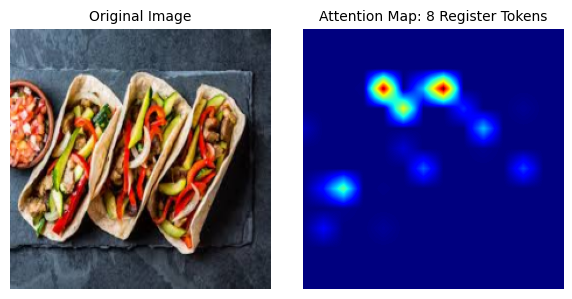

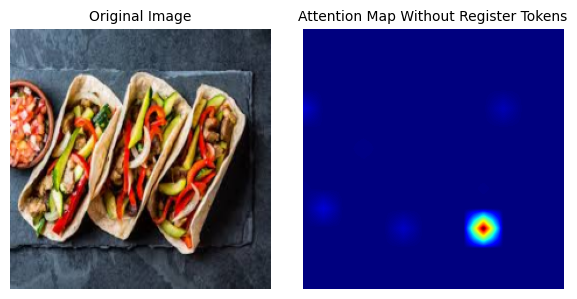

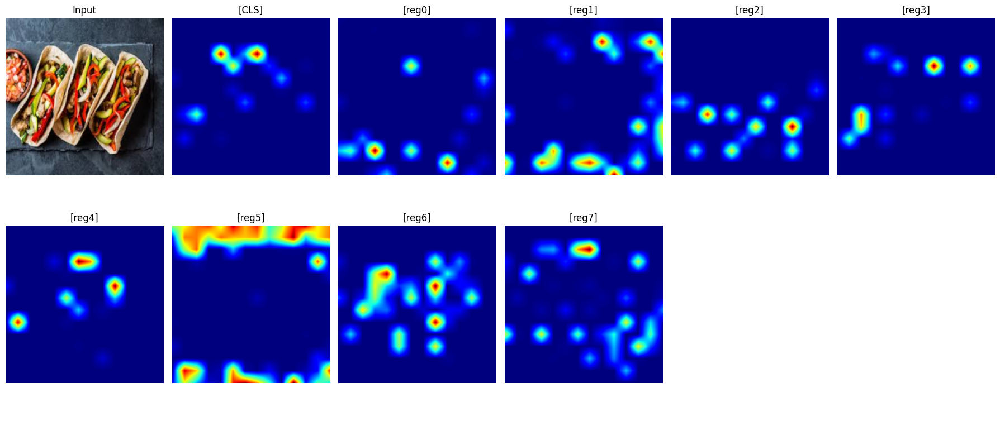

In [17]:
# 데이터 준비
check_attnmap_images, _ = next(iter(train_loader))
check_attnmap_images = check_attnmap_images.to(device)

# 모델을 평가 모드로 설정
model_with_register.eval()
model_without_register.eval()

# Attention 맵 추출
with torch.no_grad():
    _, attn_maps_with_register = model_with_register(check_attnmap_images)
    _, attn_maps_without_register = model_without_register(check_attnmap_images)

visualize_cls_attention(attn_maps_with_register[-1], check_attnmap_images[0], head_index=0, num_register_tokens=num_register_tokens)
visualize_cls_attention(attn_maps_without_register[-1], check_attnmap_images[0], head_index=0)
visualize_all_attention(
    attn_map=attn_maps_with_register[-1],
    image=check_attnmap_images[0],
    num_register_tokens=num_register_tokens,
    upscale_factor=16,
    head_index=0  # 특정 헤드 인덱스
)

## 선형프로빙 

In [10]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
import seaborn as sns
from collections import Counter
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch

In [11]:
def ensure_class_diversity(indices, patch_labels, grid_size):
    """
    패치 인덱스에서 최소 두 개 이상의 클래스를 포함하도록 샘플링.
    """
    unique_classes = np.unique(patch_labels[indices])
    if len(unique_classes) < 2:
        # 추가 클래스가 필요하면 전체 데이터에서 새 샘플 선택
        additional_indices = []
        for cls in np.unique(patch_labels):
            cls_indices = np.where(patch_labels == cls)[0]
            if len(cls_indices) > 0:
                additional_indices.extend(np.random.choice(cls_indices, size=min(grid_size // 2, len(cls_indices)), replace=False))
        indices = np.array(additional_indices)
    return indices

def get_outlier_and_normal_patches(patch_norms, patch_labels, threshold, grid_size):
    """
    L2 norm 기준으로 아웃라이어와 정상 패치를 구분하고, 클래스 다양성을 보장.
    """
    # L2 norm 기준으로 아웃라이어와 정상 패치 구분
    top_indices = np.where(patch_norms > threshold)[0]  # L2 norm 초과 패치
    normal_indices = np.where(patch_norms <= threshold)[0]  # L2 norm 이하 패치

    # 클래스 다양성을 보장
    top_indices = ensure_class_diversity(top_indices, patch_labels, grid_size)
    normal_indices = ensure_class_diversity(normal_indices, patch_labels, grid_size)

    return top_indices, normal_indices

def multitask_linear_probe(model, images, labels, threshold=150, grid_size=14):
    """
    CLS 토큰, 아웃라이어 패치, 정상 패치의 성능을 측정하고 시각화에 필요한 데이터를 반환.
    """
    model.eval()

    all_patch_embeddings = []
    all_cls_embeddings = []
    all_patch_labels = []
    all_patch_groups = []
    all_patch_probs = []  # 각 패치의 확률 저장
    image_top_indices = []  # 이미지별 아웃라이어 패치 인덱스 저장
    image_normal_indices = []  # 이미지별 정상 패치 인덱스 저장

    for idx in range(len(images)):  # 각 이미지 처리
        with torch.no_grad():
            cls_embedding, patch_embeddings = model.get_cls_and_patch_embeddings(images[idx:idx+1])  # CLS + Patch Embeddings
            patch_norms = torch.norm(patch_embeddings, dim=-1).view(-1).cpu().numpy()  # L2 norm 계산

        num_patches = patch_embeddings.shape[1]
        patch_embeddings = patch_embeddings.view(-1, patch_embeddings.shape[-1]).cpu().numpy()  # CPU로 이동 후 NumPy 변환
        cls_embedding = cls_embedding.cpu().numpy()  # CPU로 이동 후 NumPy 변환
        patch_labels = np.array([labels[idx].item()] * num_patches)

        # 아웃라이어와 정상 패치 구분
        top_indices, normal_indices = get_outlier_and_normal_patches(patch_norms, patch_labels, threshold, grid_size)

        # 그룹 레이블: 아웃라이어=1, 정상=0
        patch_groups = np.zeros(num_patches)
        patch_groups[top_indices] = 1

        # 데이터 누적
        all_patch_embeddings.append(patch_embeddings)
        all_cls_embeddings.append(cls_embedding)
        all_patch_labels.append(patch_labels)
        all_patch_groups.append(patch_groups)

        # 이미지별 데이터 저장
        image_top_indices.append(top_indices)
        image_normal_indices.append(normal_indices)

    # Flatten 데이터 생성
    all_patch_embeddings = np.vstack(all_patch_embeddings)
    all_cls_embeddings = np.vstack(all_cls_embeddings)
    all_patch_labels = np.hstack(all_patch_labels)
    all_patch_groups = np.hstack(all_patch_groups)

    # 선형 분류기 학습
    clf_patches = LogisticRegression(max_iter=10000, class_weight="balanced")
    clf_patches.fit(all_patch_embeddings, all_patch_groups)
    all_patch_probs = clf_patches.predict_proba(all_patch_embeddings)[:, 1]  # 아웃라이어 확률

    clf_cls = LogisticRegression(max_iter=10000, class_weight="balanced")
    clf_cls.fit(all_cls_embeddings, labels.cpu().numpy())  # CPU로 이동 후 NumPy 변환

    # CLS 성능 측정
    cls_predictions = clf_cls.predict(all_cls_embeddings)
    cls_metrics = {
        "accuracy": accuracy_score(labels.cpu().numpy(), cls_predictions),
        "precision": precision_score(labels.cpu().numpy(), cls_predictions, average="macro", zero_division=1),
        "recall": recall_score(labels.cpu().numpy(), cls_predictions, average="macro", zero_division=1),
        "f1_score": f1_score(labels.cpu().numpy(), cls_predictions, average="macro", zero_division=1),
    }

    # 패치 성능 측정
    outlier_indices = np.where(all_patch_groups == 1)[0]
    normal_indices = np.where(all_patch_groups == 0)[0]

    outlier_metrics = {
        "accuracy": accuracy_score(all_patch_groups[outlier_indices], clf_patches.predict(all_patch_embeddings[outlier_indices])),
        "precision": precision_score(all_patch_groups[outlier_indices], clf_patches.predict(all_patch_embeddings[outlier_indices]), zero_division=1),
        "recall": recall_score(all_patch_groups[outlier_indices], clf_patches.predict(all_patch_embeddings[outlier_indices]), zero_division=1),
        "f1_score": f1_score(all_patch_groups[outlier_indices], clf_patches.predict(all_patch_embeddings[outlier_indices]), zero_division=1),
    }

    normal_metrics = {
        "accuracy": accuracy_score(all_patch_groups[normal_indices], clf_patches.predict(all_patch_embeddings[normal_indices])),
        "precision": precision_score(all_patch_groups[normal_indices], clf_patches.predict(all_patch_embeddings[normal_indices]), zero_division=1),
        "recall": recall_score(all_patch_groups[normal_indices], clf_patches.predict(all_patch_embeddings[normal_indices]), zero_division=1),
        "f1_score": f1_score(all_patch_groups[normal_indices], clf_patches.predict(all_patch_embeddings[normal_indices]), zero_division=1),
    }

    return {
        "outlier": outlier_metrics,
        "normal": normal_metrics,
        "cls": cls_metrics,
        "image_top_indices": image_top_indices,  # 시각화를 위한 아웃라이어 패치 인덱스
        "image_normal_indices": image_normal_indices,
        "all_patch_probs": all_patch_probs,  # 시각화를 위한 패치 확률
    }


In [12]:
def visualize_patch_predictions(image, top_indices, all_patch_probs, num_patches):
    """
    패치 성능을 원래 이미지에 시각화.
    """
    grid_size = int(np.sqrt(num_patches))
    if grid_size ** 2 != num_patches:
        raise ValueError(f"Grid size mismatch: {grid_size}x{grid_size} != {num_patches}")

    # 모든 패치 확률 초기화
    patch_probs = all_patch_probs[:num_patches].reshape(grid_size, grid_size)

    # 레이아웃 구성
    fig = plt.figure(figsize=(14, 7))  # 전체 그림 크기 유지
    gs = GridSpec(2, 2, figure=fig, height_ratios=[12, 1], width_ratios=[1, 1])  # 이미지 크기 비율 확대

    # 왼쪽: 원본 이미지
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(image.permute(1, 2, 0).cpu().numpy())
    ax1.axis("off")  # 축 제거

    # 오른쪽: 패치 시각화 이미지
    ax2 = fig.add_subplot(gs[0, 1])
    patch_size = image.shape[1] // grid_size  # 패치 크기 계산

    ax2.imshow(image.permute(1, 2, 0).cpu().numpy())  # 배경 이미지
    for i in range(grid_size):
        for j in range(grid_size):
            patch_index = i * grid_size + j
            prob = patch_probs[i, j]

            # 패치 내부는 부드러운 회색으로 표시
            face_color = (1 - prob, 1 - prob, 1 - prob, 0.7)  # 회색 톤 + 투명도 0.7
            rect = plt.Rectangle(
                (j * patch_size, i * patch_size),
                patch_size,
                patch_size,
                linewidth=3,  # 적당히 두꺼운 테두리
                edgecolor='red' if patch_index in top_indices else 'none',  # 아웃라이어는 빨간 테두리
                facecolor=face_color
            )
            ax2.add_patch(rect)

            # 텍스트 추가 (확률값 표시)
            text_color = "white" if prob > 0.5 else "black"
            ax2.text(
                j * patch_size + patch_size / 2,
                i * patch_size + patch_size / 2,
                f"{prob:.2f}",
                color=text_color,
                ha="center",
                va="center",
                fontsize=11,  # 텍스트 크기
                weight="light"
            )
    ax2.axis("off")  # 축 제거

    # 하단: 범례 추가
    ax_legend = fig.add_subplot(gs[1, :])
    ax_legend.axis("off")
    legend_elements = [
        Patch(facecolor=(0.5, 0.5, 0.5, 0.6), edgecolor='none', label='All Patches (Gray)'),
        Patch(facecolor='none', edgecolor='red', linewidth=2, label='Outlier Patch (Red Border)'),
    ]
    ax_legend.legend(handles=legend_elements, loc='center', ncol=2, frameon=False, fontsize=14)  # 범례 글씨 크기 줄임

    plt.tight_layout()
    plt.show()


In [13]:
def prepare_images_and_labels(loader, device, target_num_images=10):
    """
    다양한 이미지를 가져와 라벨 다양성을 보장.
    """
    images, labels = [], []
    while len(images) < target_num_images:
        batch_images, batch_labels = next(iter(loader))
        images.append(batch_images)
        labels.append(batch_labels)
    
    # 이미지와 라벨 병합
    images = torch.cat(images[:target_num_images], dim=0).to(device)
    labels = torch.cat(labels[:target_num_images], dim=0).to(device)

    return images, labels

/home/user/anaconda3/envs/mycv/lib/python3.9/site-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(



== Linear Probing Results ==

With Register Tokens
  CLS Token:
    Accuracy: 0.8000, Precision: 0.8034, Recall: 0.8060, F1 Score: 0.8009
  Outlier Patch:
    Accuracy: 0.5982, Precision: 1.0000, Recall: 0.5982, F1 Score: 0.7486
  Normal Patch:
    Accuracy: 0.5820, Precision: 0.0000, Recall: 1.0000, F1 Score: 0.0000

Without Register Tokens
  CLS Token:
    Accuracy: 0.8438, Precision: 0.8473, Recall: 0.8507, F1 Score: 0.8427
  Outlier Patch:
    Accuracy: 0.5696, Precision: 1.0000, Recall: 0.5696, F1 Score: 0.7258
  Normal Patch:
    Accuracy: 0.5641, Precision: 0.0000, Recall: 1.0000, F1 Score: 0.0000


== Visualizing Patch Predictions ==

Visualizing image 1/160 for 'With Register Tokens':


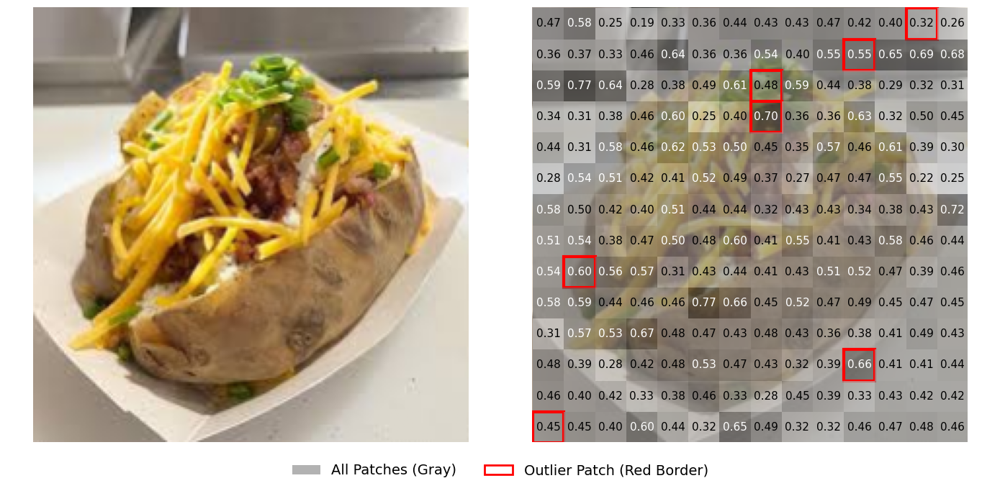

Visualizing image 1/160 for 'Without Register Tokens':


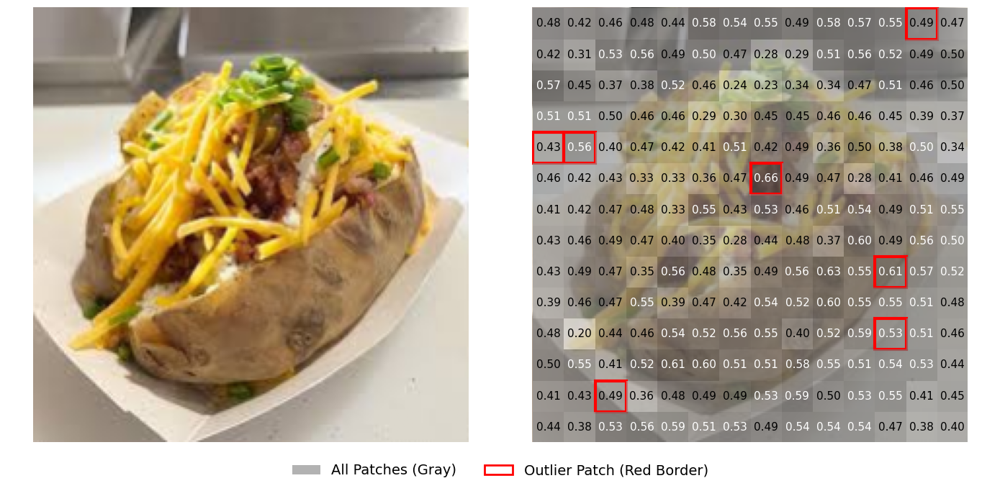

Visualizing image 2/160 for 'With Register Tokens':


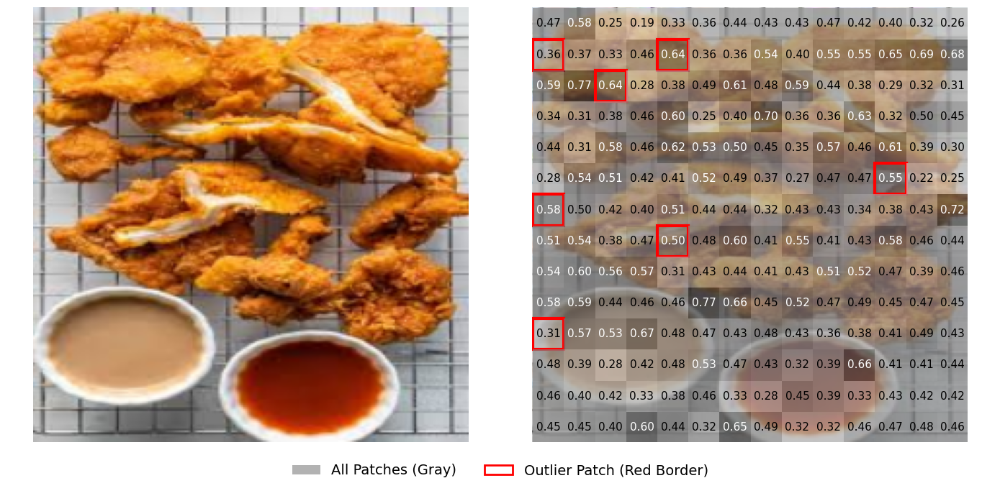

Visualizing image 2/160 for 'Without Register Tokens':


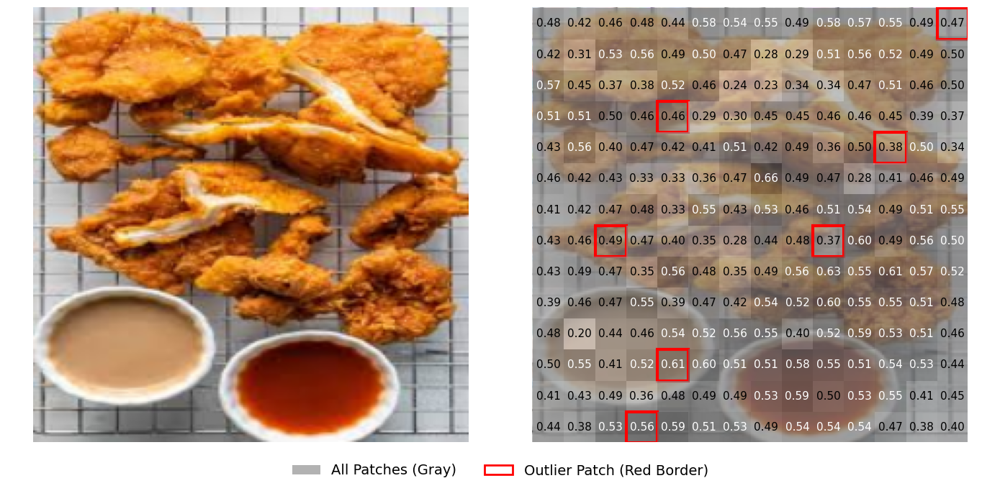

Visualizing image 3/160 for 'With Register Tokens':


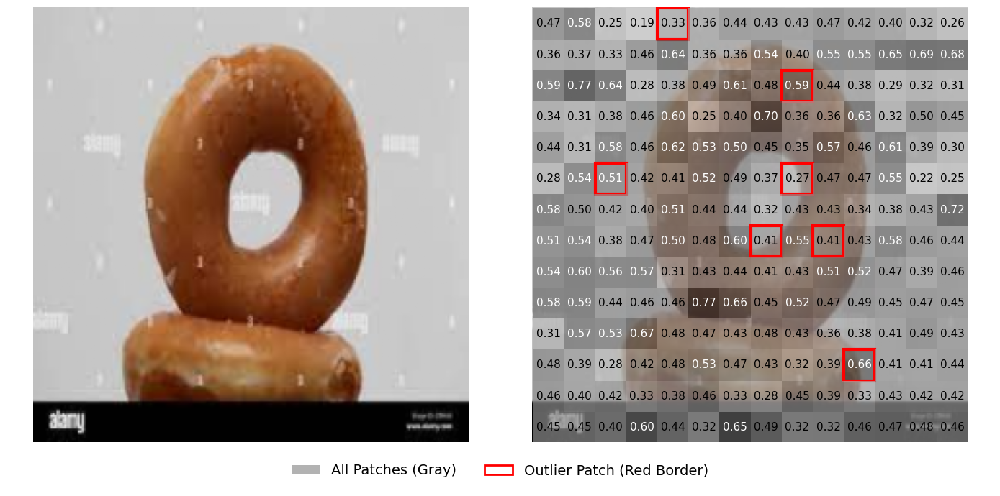

Visualizing image 3/160 for 'Without Register Tokens':


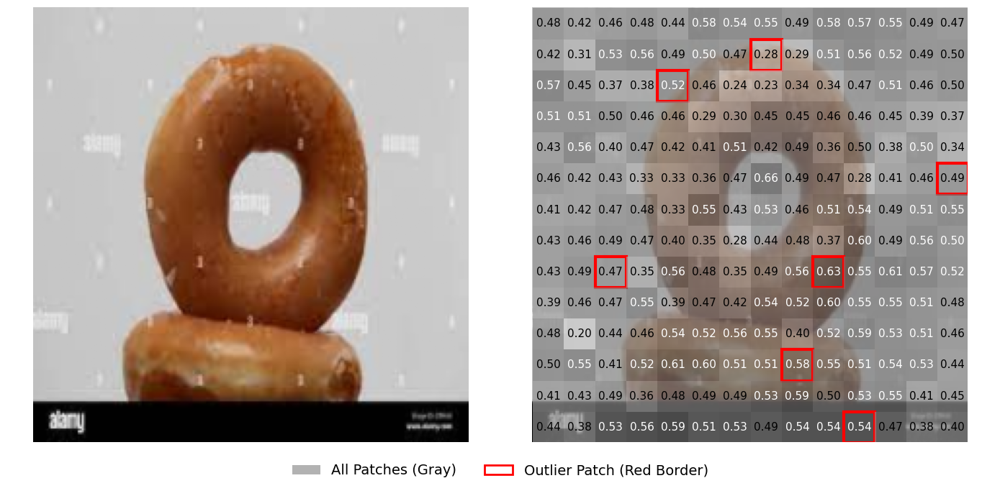

Visualizing image 4/160 for 'With Register Tokens':


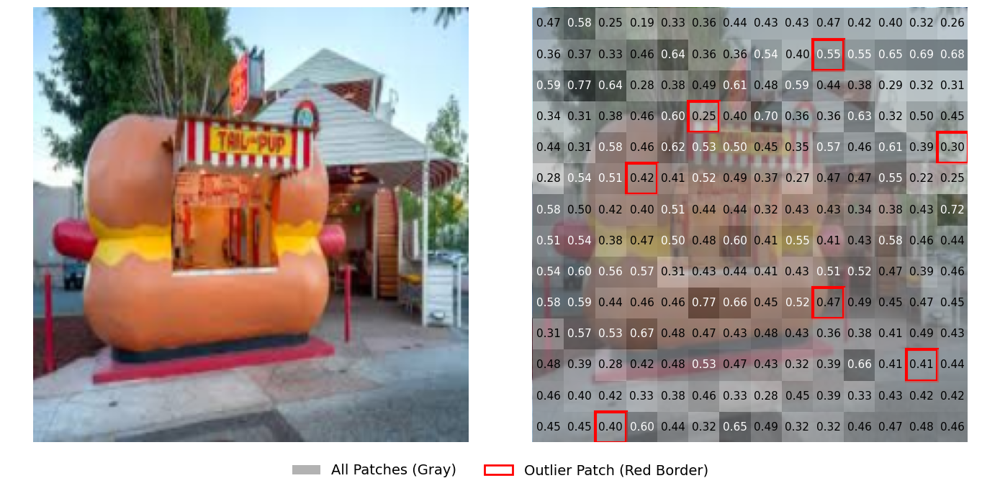

Visualizing image 4/160 for 'Without Register Tokens':


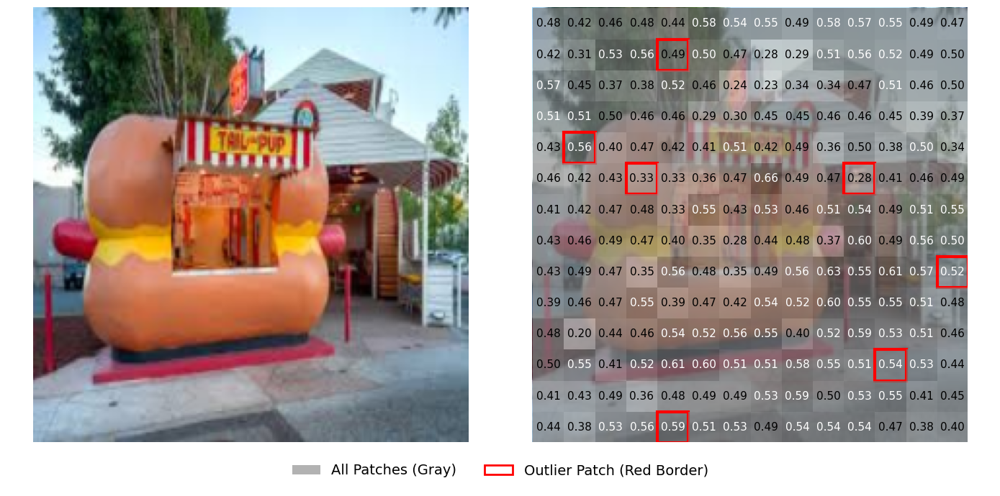

Visualizing image 5/160 for 'With Register Tokens':


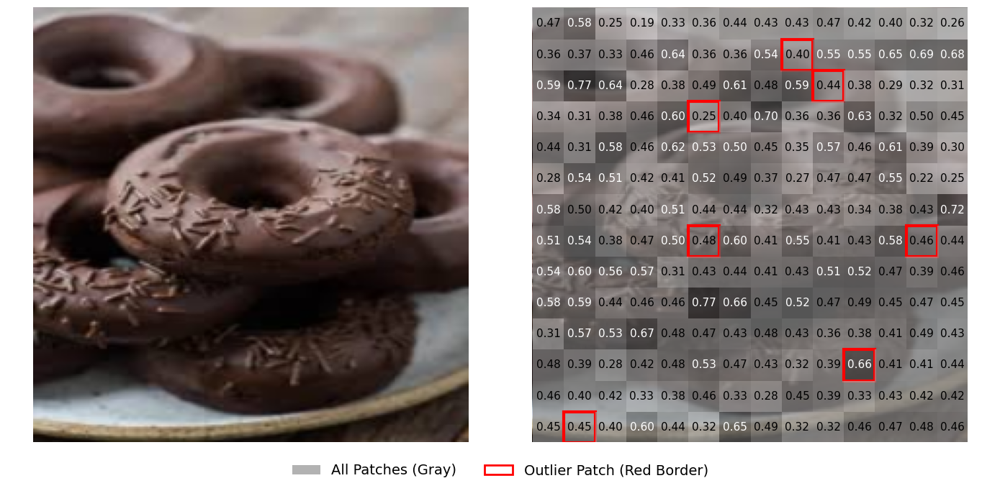

Visualizing image 5/160 for 'Without Register Tokens':


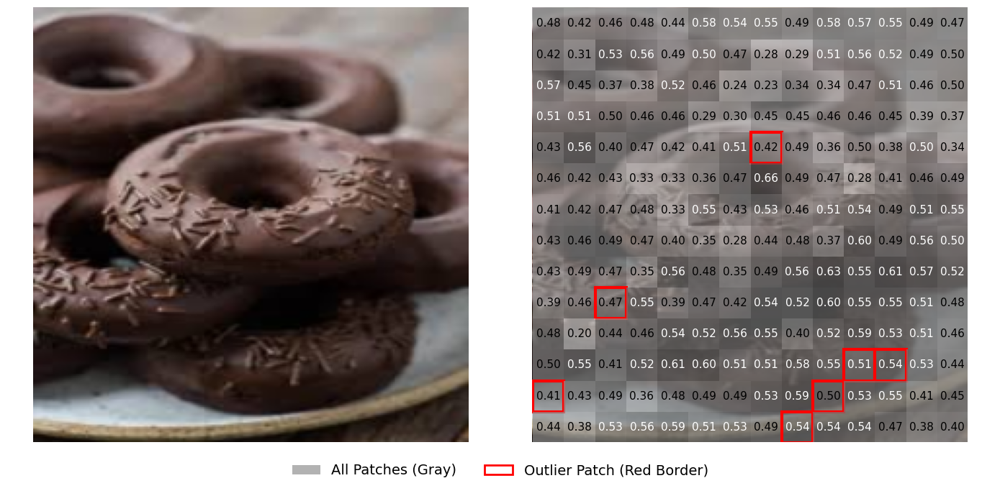

In [14]:
# 이미지 선택 및 어텐션 맵 추출
images, labels = prepare_images_and_labels(train_loader, device, target_num_images=10)

# 선형 프로빙 수행
results_with = multitask_linear_probe(model_with_register, images, labels, threshold=150, grid_size=14)
results_without = multitask_linear_probe(model_without_register, images, labels, threshold=150, grid_size=14)

print("\n== Linear Probing Results ==")

print("\nWith Register Tokens")
print("  CLS Token:")
print(f"    Accuracy: {results_with['cls']['accuracy']:.4f}, Precision: {results_with['cls']['precision']:.4f}, Recall: {results_with['cls']['recall']:.4f}, F1 Score: {results_with['cls']['f1_score']:.4f}")
print("  Outlier Patch:")
print(f"    Accuracy: {results_with['outlier']['accuracy']:.4f}, Precision: {results_with['outlier']['precision']:.4f}, Recall: {results_with['outlier']['recall']:.4f}, F1 Score: {results_with['outlier']['f1_score']:.4f}")
print("  Normal Patch:")
print(f"    Accuracy: {results_with['normal']['accuracy']:.4f}, Precision: {results_with['normal']['precision']:.4f}, Recall: {results_with['normal']['recall']:.4f}, F1 Score: {results_with['normal']['f1_score']:.4f}")

print("\nWithout Register Tokens")
print("  CLS Token:")
print(f"    Accuracy: {results_without['cls']['accuracy']:.4f}, Precision: {results_without['cls']['precision']:.4f}, Recall: {results_without['cls']['recall']:.4f}, F1 Score: {results_without['cls']['f1_score']:.4f}")
print("  Outlier Patch:")
print(f"    Accuracy: {results_without['outlier']['accuracy']:.4f}, Precision: {results_without['outlier']['precision']:.4f}, Recall: {results_without['outlier']['recall']:.4f}, F1 Score: {results_without['outlier']['f1_score']:.4f}")
print("  Normal Patch:")
print(f"    Accuracy: {results_without['normal']['accuracy']:.4f}, Precision: {results_without['normal']['precision']:.4f}, Recall: {results_without['normal']['recall']:.4f}, F1 Score: {results_without['normal']['f1_score']:.4f}")

print("\n\n== Visualizing Patch Predictions ==\n")

for idx in range(5):  # 5개 이미지 시각화
    print(f"Visualizing image {idx + 1}/{len(images)} for 'With Register Tokens':")
    visualize_patch_predictions(images[idx], results_with["image_top_indices"][idx], results_with["all_patch_probs"], num_patches=196)

    print(f"Visualizing image {idx + 1}/{len(images)} for 'Without Register Tokens':")
    visualize_patch_predictions(images[idx], results_without["image_top_indices"][idx], results_without["all_patch_probs"], num_patches=196)
